In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
from Scratch import metadata_loader
import numpy as np
from tqdm import tqdm

DEVICE = "ibm_sherbrooke"
LOGICAL = str(0)
XBASIS = False
ROUNDS = 10

state = "X" if XBASIS else "Z"
state += LOGICAL
print(f"state = {state}")


# Load the metadata
md = metadata_loader(True, True)
md = md[md["job_status"] == "JobStatus.DONE"]
md = md[md["code"] == "RepetitionCodeCircuit"]
md = md[md["descr"] == 'subset RepCodes']
md = md.dropna(subset=["rounds"])
md = md[md["meas_level"] == 1]
md['rounds'] = md['rounds'].astype(int)
md['distance'] = md['distance'].astype(int)

md = md[md["backend_name"] == DEVICE]
md = md[md["logical"] == LOGICAL]
md = md[md["xbasis"] == XBASIS]
md = md[md["rounds"] == ROUNDS]

md = md[md['notebook_name']=='Sherbrooke_RepCodes_jobs']

# md = md[0:1]
print("shape:", md.shape)
md[:2]


state = Z0
shape: (40, 18)


,creation_date,notebook_name,backend_name,job_id,tags,meas_level,shots,num_qubits,job_status,execution_date,code,distance,rounds,logical,descr,resets,xbasis,path_info
4246,2024-03-23 09:24:23.431000+01:00,Sherbrooke_RepCodes_jobs,ibm_sherbrooke,cqz93dxs9z7g008dny3g,"[Subset 52, 10 rounds, 0 log, xbasis=False]",1.0,6525.0,NaN,JobStatus.DONE,2024-03-23 10:20:19.544059+01:00,RepetitionCodeCircuit,52,10,0,subset RepCodes,NaN,False,"{'mean_gate_error': 0.007733045348037, 'min_ga..."
4245,2024-03-23 09:24:20.868000+01:00,Sherbrooke_RepCodes_jobs,ibm_sherbrooke,cqz93d5czq6g0081h1vg,"[Subset 52, 10 rounds, 0 log, xbasis=False]",1.0,6525.0,NaN,JobStatus.DONE,2024-03-23 10:19:41.529823+01:00,RepetitionCodeCircuit,52,10,0,subset RepCodes,NaN,False,"{'mean_gate_error': 0.007733045348037, 'min_ga..."


In [3]:
from result_saver import SaverProvider

provider = SaverProvider()
md_loc = 0

job_id = md.iloc[md_loc]["job_id"]
job = provider.retrieve_job(job_id) 

execution_date = job.result().date
memory = job.result().get_memory()

print(f"Execution date: {execution_date}")

Execution date: 2024-03-23 10:20:19.544059+01:00


In [4]:
from soft_info import inv_qubit_mapping, get_repcode_IQ_map

_RESETS = False
SOFT_MUL = 0.5
T = md.iloc[md_loc]["rounds"]
d = md.iloc[md_loc]["distance"]

shots = md.iloc[md_loc]["shots"]
# Get the layout of the last job (same as previous)
layout_des = job.deserialize_layout(job.initial_layouts()[0]) # only 1 layout
link_qubits = list(layout_des['link_qubit'].values())
code_qubits = list(layout_des['code_qubit'].values())

# Get the pSoft and countMat matrices
big_layout = link_qubits + code_qubits
inverted_q_map = inv_qubit_mapping(get_repcode_IQ_map(big_layout, synd_rounds=T))

In [5]:
from Scratch import load_calibration_memory

all_memories_PS, _, msmt_err_dict = load_calibration_memory(provider, tobecalib_job=job_id, post_process=True, double_msmt=True)

Specified job execution date: 2024-03-23 10:20:19.544059+01:00
Found jobs for backend ibm_sherbrooke with closest execution date 2024-03-23 09:21:22.889460+00:00.


# New pipeline

In [6]:
import numpy as np
from sklearn.mixture import GaussianMixture


def process_complex_data(data):
    real_parts = data.real
    imag_parts = data.imag
    combined_data = np.column_stack([real_parts, imag_parts])
    return combined_data

def initialize_gmm(data, n_components, covariance_type='diag'):
    gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type)
    gmm.fit(data)
    return gmm

def initialize_state1(base_model, data, n_components):
    means_init = []
    weights_init = None
    covariance_init = base_model.covariances_ if n_components == 1 else None
    if n_components == 1:
        # Single component, mirrored mean
        mean = np.array([[-base_model.means_[0, 0], base_model.means_[0, 1]]])
        means_init = mean
        new_gmm = GaussianMixture(n_components=n_components, covariance_type='diag',
                                  means_init=means_init, precisions_init=1 / covariance_init)
    elif n_components == 2:
        # Two components with specific mean adjustments and full covariance
        mean1 = np.array([-base_model.means_[0, 0], base_model.means_[0, 1]])
        mean2 = np.array([-3 * base_model.means_[0, 0], 1.5 * base_model.means_[0, 1]])
        means_init = np.array([mean1, mean2])
        weights_init = np.array([0.9, 0.1])
        new_gmm = GaussianMixture(n_components=n_components, covariance_type='full',
                                  means_init=means_init, weights_init=weights_init)

    new_gmm.fit(data)
    return new_gmm

def compare_gmms(data0, data1):
    processed_data0 = process_complex_data(data0)
    processed_data1 = process_complex_data(data1)

    # Fit GMM to state 0 data
    gmm_state0 = initialize_gmm(processed_data0, 1, 'diag')
    
    # Initialize and fit GMMs for state 1
    gmm_state1_1comp = initialize_state1(gmm_state0, processed_data1, 1)
    gmm_state1_2comp = initialize_state1(gmm_state0, processed_data1, 2)

    # Calculate BIC to determine better fit
    bic_1 = gmm_state1_1comp.bic(processed_data1)
    bic_2 = gmm_state1_2comp.bic(processed_data1)

    print(f"BIC for 1 component in state 1: {bic_1}")
    print(f"BIC for 2 components in state 1: {bic_2}")

    return gmm_state0, gmm_state1_1comp if bic_1 < bic_2 else gmm_state1_2comp

# Example usage
# Assuming 'all_memories_PS' is a dictionary that contains numpy arrays of complex numbers for 'mmr_0' and 'mmr_1'.
qubit = 3
gmm0, gmm1_best = compare_gmms(all_memories_PS[qubit]['mmr_0'], all_memories_PS[qubit]['mmr_1'])


BIC for 1 component in state 1: 955571.5379157467
BIC for 2 components in state 1: 950239.4362872101


In [8]:
from soft_info import plot_multiple_IQ_data
for qubit in range(126):
    # plot_multiple_IQ_data([all_memories_PS[qubit]['mmr_0'], all_memories_PS[qubit]['mmr_1']], title=f"Qubit {qubit}")
    continue

# Fit GMM to calib data 

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from matplotlib.patches import Ellipse

def fit_and_plot_gmm_with_classifications(data, n_components_range=[2, 3], covariance_type='full'):
    # Flatten the data if it is complex
    real_parts = np.real(data).flatten()
    imag_parts = np.imag(data).flatten()
    X = np.column_stack([real_parts, imag_parts])

    # Fit GMMs with 2 and 3 components
    lowest_bic = np.infty
    bic = []
    best_gmm = None
    for n_components in n_components_range:
        if covariance_type == 'tied':
            gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type)
        else:
            # Example means initialization for 'full', 'diag', and 'spherical'
            initial_means = np.linspace(X.min(), X.max(), n_components)
            means_init = np.column_stack([initial_means, initial_means])  # Simple linear init
            gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, means_init=means_init)
        
        gmm.fit(X)
        bic.append(gmm.bic(X))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

    # Classify points
    predictions = best_gmm.predict(X)

    # Plot the data
    plt.figure(figsize=(4, 4))
    scatter = plt.scatter(real_parts, imag_parts, s=0.5, c=predictions, cmap='viridis')

    # Create a color bar
    plt.colorbar(scatter)

    # Plot the GMM components
    ax = plt.gca()
    for mean, cov in zip(best_gmm.means_, best_gmm.covariances_):
        if covariance_type == 'tied':
            v, w = np.linalg.eigh(best_gmm.covariances_)
        else:
            v, w = np.linalg.eigh(cov)
        v = 2. * np.sqrt(2.) * np.sqrt(v)  # 2*sqrt(2) scales to 1 std
        u = w[0] / np.linalg.norm(w[0])
        # Plot an ellipse to show the Gaussian component
        angle = np.arctan2(u[1], u[0])
        angle = np.degrees(angle)  # Convert to degrees
        ell = Ellipse(mean, v[0], v[1], angle=angle, edgecolor='black', facecolor='none')
        ax.add_artist(ell)
        ell.set_clip_box(ax.bbox)
        ell.set_alpha(0.5)

    plt.xlabel('Real Part')
    plt.ylabel('Imaginary Part')
    plt.title('Gaussian Mixture Model Fit with Classifications')
    plt.show()

    return best_gmm


def fit_and_plot_gmm_with_classifications_informed(data, n_components_range=[2, 3]):
    # Flatten the data if it is complex
    real_parts = np.real(data).flatten()
    imag_parts = np.imag(data).flatten()
    X = np.column_stack([real_parts, imag_parts])

    # Fit GMMs with 2 and 3 components
    lowest_bic = np.infty
    bic = []
    best_gmm = None
    for n_components in n_components_range:
        if n_components == 2:
            weights_init = np.array([0.5, 0.5])
            gmm = GaussianMixture(n_components=n_components, covariance_type='tied', weights_init=weights_init)
        elif n_components == 3:
            weights_init = np.array([0.48, 0.48, 0.04])
            gmm = GaussianMixture(n_components=n_components, covariance_type='tied', weights_init=weights_init)
        else:
            gmm = GaussianMixture(n_components=n_components, covariance_type='tied')
        
        gmm.fit(X)
        bic.append(gmm.bic(X))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

    # Classify points
    predictions = best_gmm.predict(X)

    # Plot the data
    plt.figure(figsize=(4, 4))
    scatter = plt.scatter(real_parts, imag_parts, s=0.5, c=predictions, cmap='viridis')

    # Create a color bar
    plt.colorbar(scatter)

    # Plot the GMM components
    ax = plt.gca()
    # For tied covariance, use the same covariance for all components
    covariances = best_gmm.covariances_
    if best_gmm.covariance_type == 'tied':
        covariances = [best_gmm.covariances_] * best_gmm.n_components

    for mean, cov in zip(best_gmm.means_, covariances):
        v, w = np.linalg.eigh(cov)
        v = 2. * np.sqrt(2.) * np.sqrt(v)  # 2*sqrt(2) scales to 1 std
        u = w[0] / np.linalg.norm(w[0])
        # Plot an ellipse to show the Gaussian component
        angle = np.arctan2(u[1], u[0])
        angle = np.degrees(angle)  # Convert to degrees
        ell = Ellipse(mean, v[0], v[1], angle=angle, edgecolor='black', facecolor='none')
        ax.add_artist(ell)
        ell.set_clip_box(ax.bbox)
        ell.set_alpha(0.5)

    plt.xlabel('Real Part')
    plt.ylabel('Imaginary Part')
    plt.title('Gaussian Mixture Model Fit with Classifications')
    plt.show()

    return best_gmm


Qubit 0


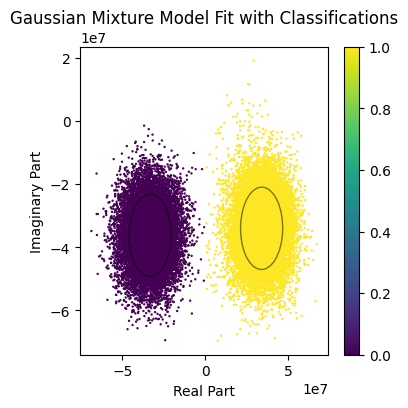

Qubit 1


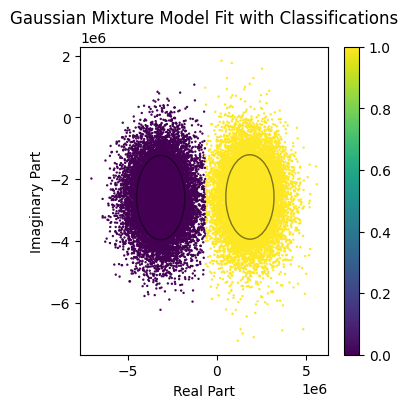

Qubit 2


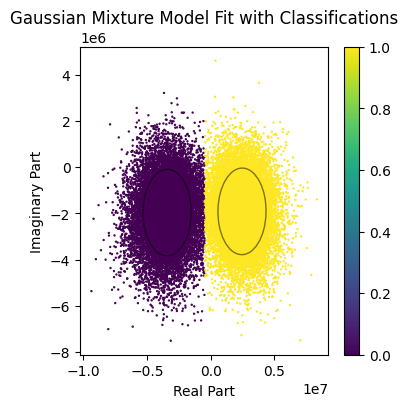

Qubit 3


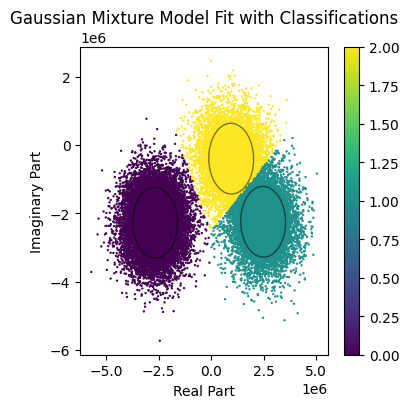

Qubit 4


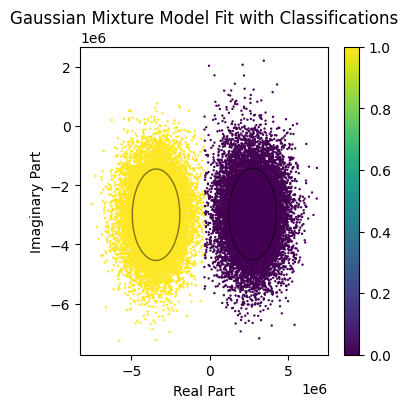

Qubit 5


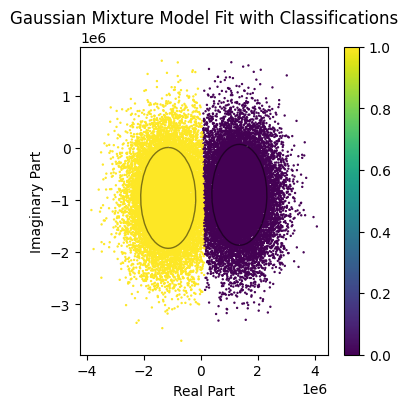

Qubit 6


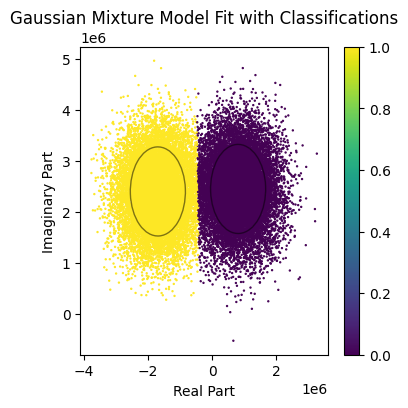

Qubit 7


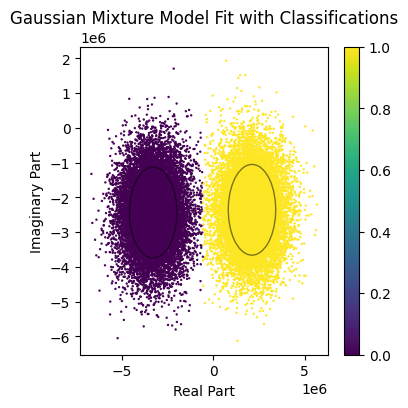

Qubit 8


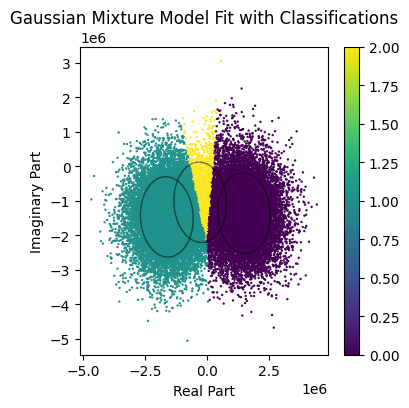

Qubit 9


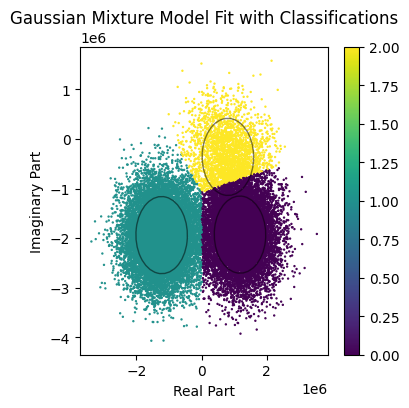

Qubit 10


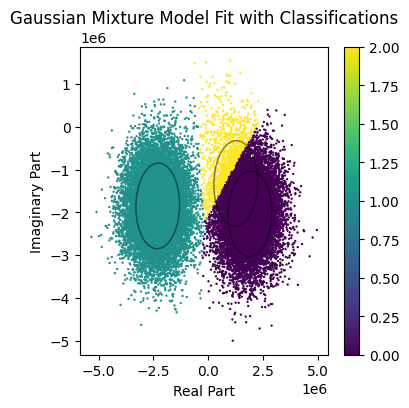

Qubit 11


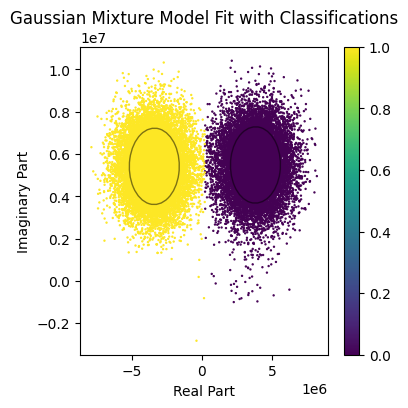

Qubit 12


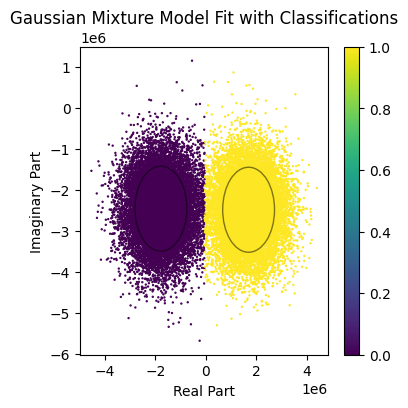

Qubit 13


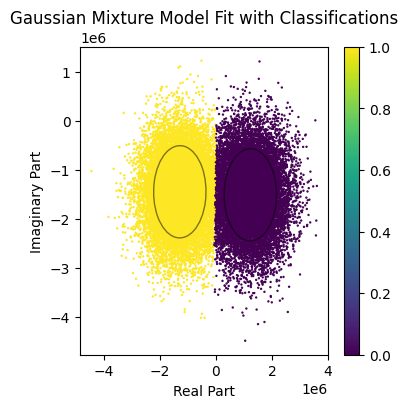

Qubit 14


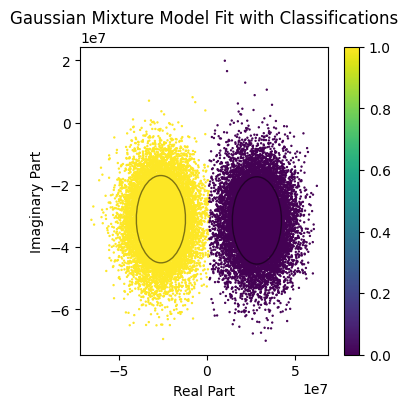

Qubit 15


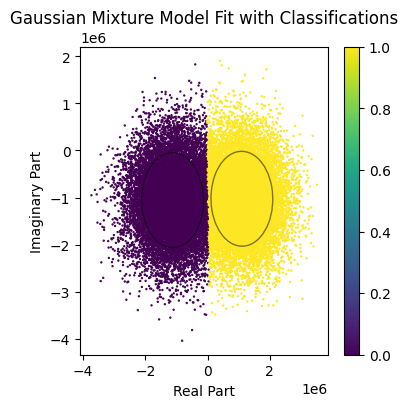

Qubit 16


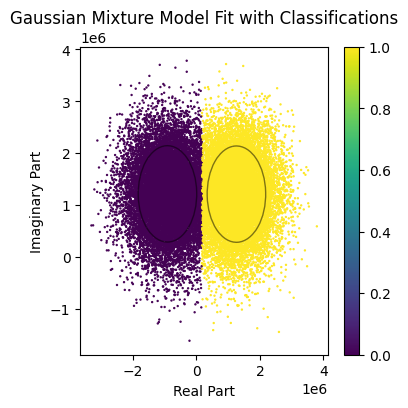

Qubit 17


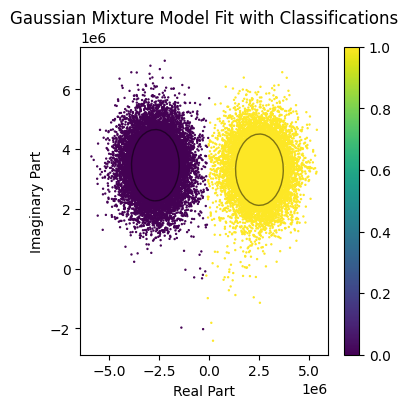

Qubit 18


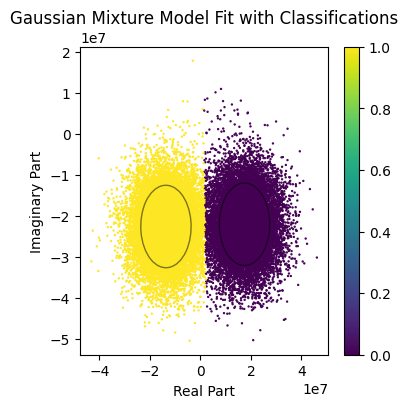

Qubit 19


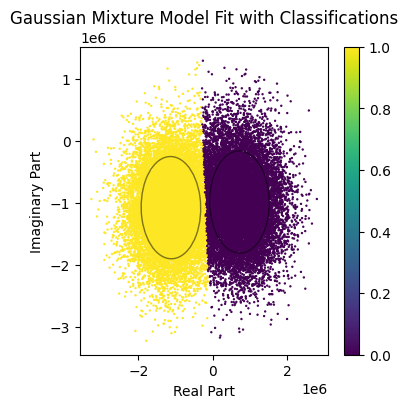

Qubit 20


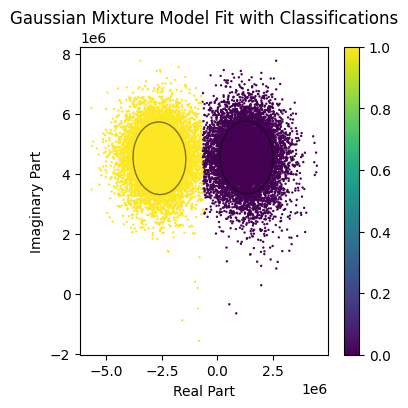

Qubit 21


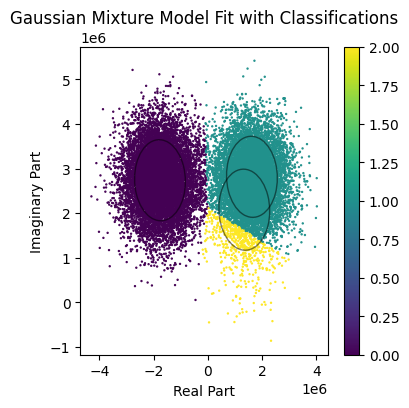

Qubit 22


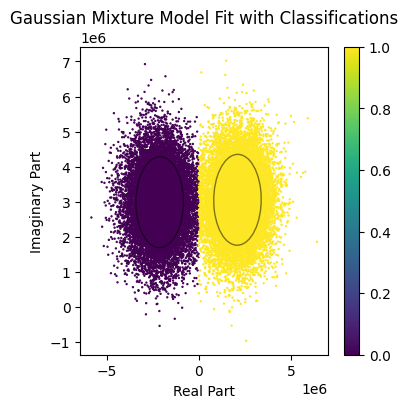

Qubit 23


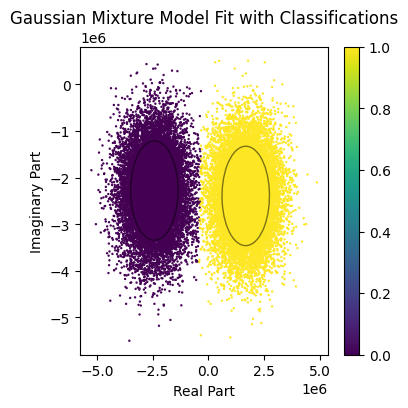

Qubit 24


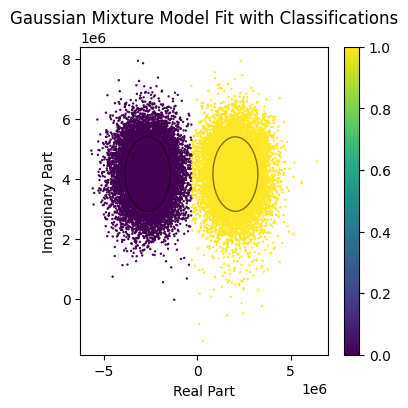

Qubit 25


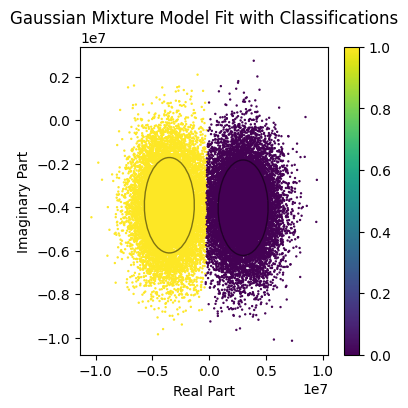

Qubit 26


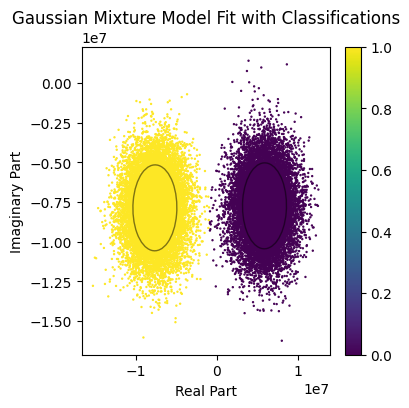

Qubit 27


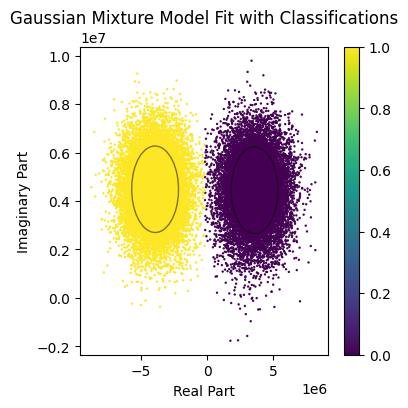

Qubit 28


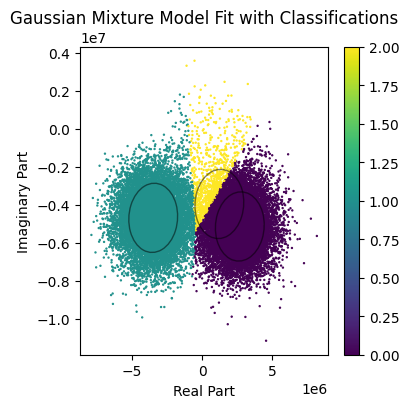

Qubit 29


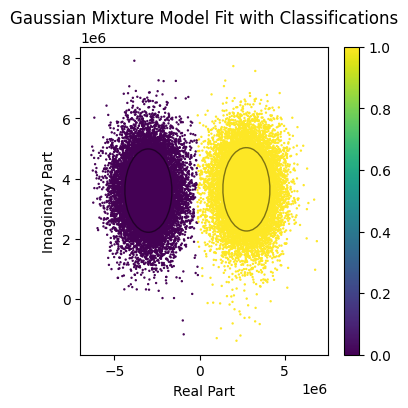

Qubit 30


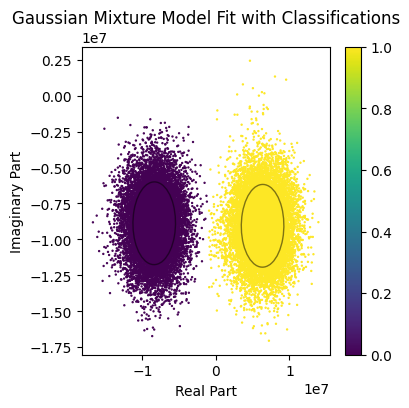

Qubit 31


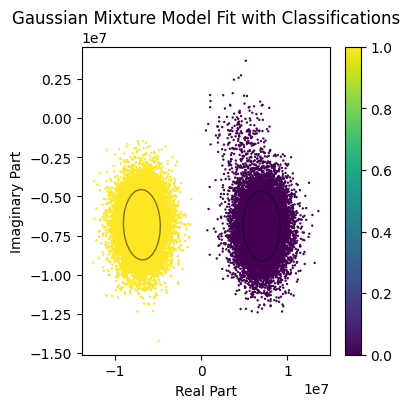

Qubit 32


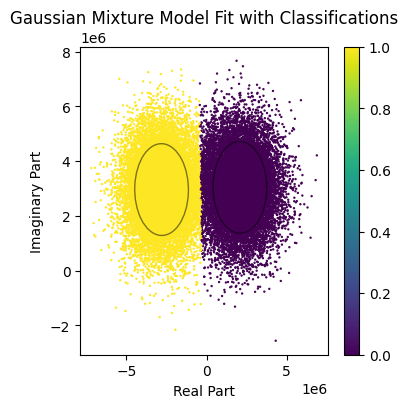

Qubit 33


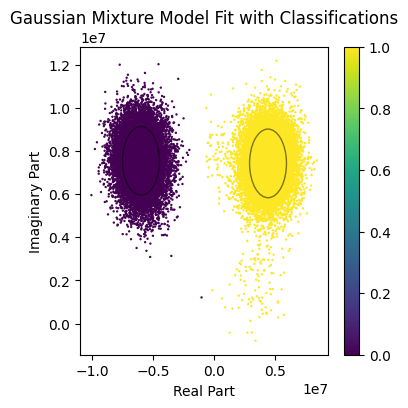

Qubit 34


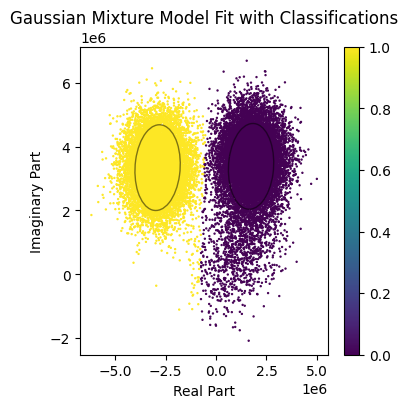

Qubit 35


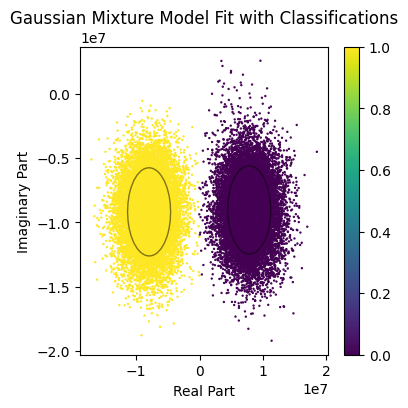

Qubit 36


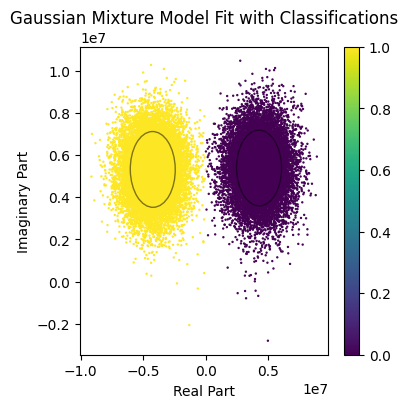

Qubit 37


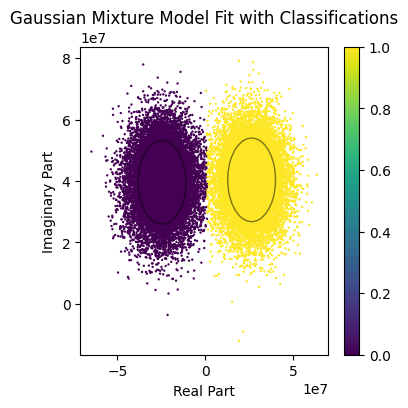

Qubit 38


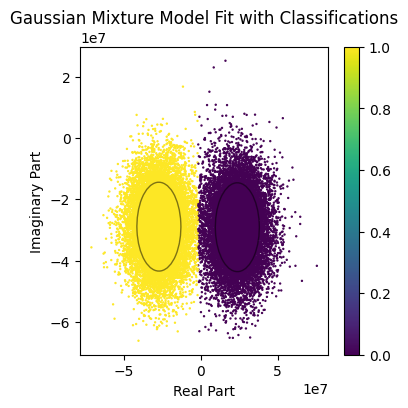

Qubit 39


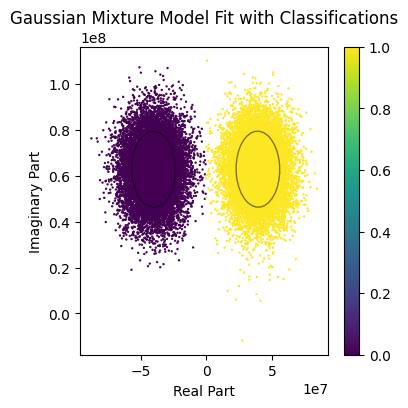

Qubit 40


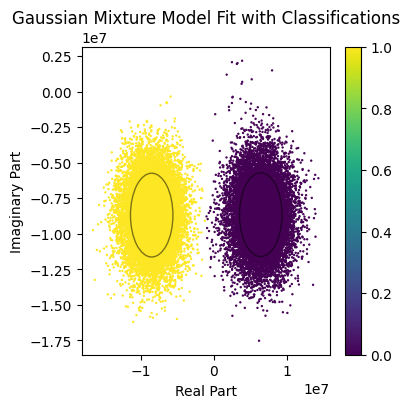

Qubit 41


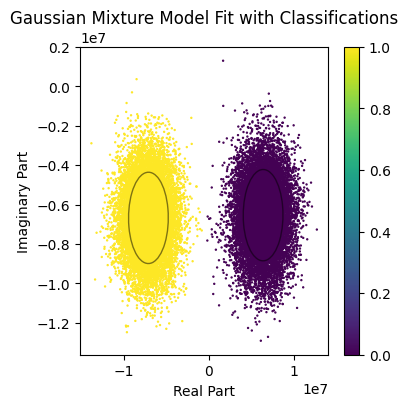

Qubit 42


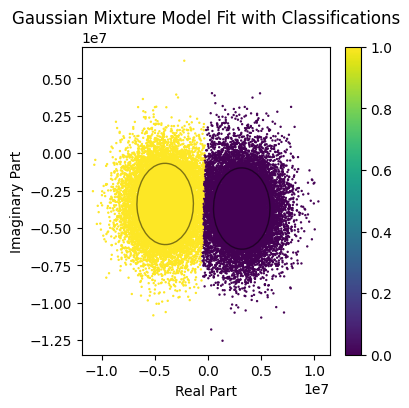

Qubit 43


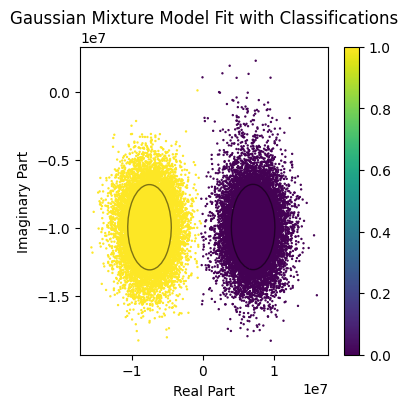

Qubit 44


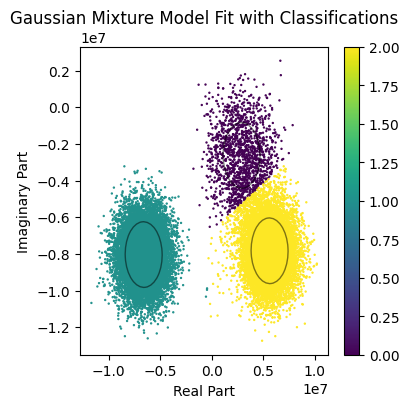

Qubit 45


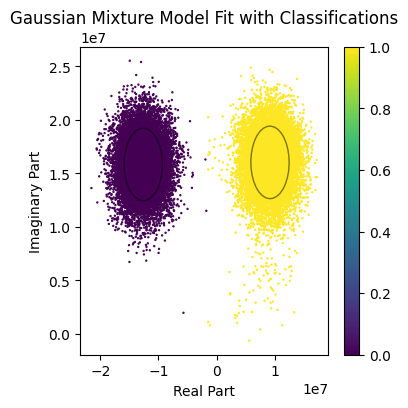

Qubit 46


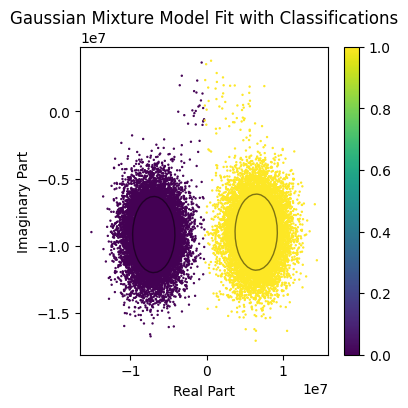

Qubit 47


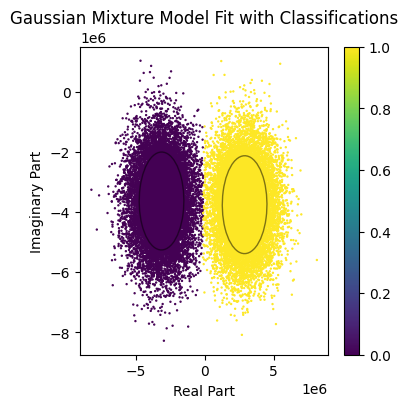

Qubit 48


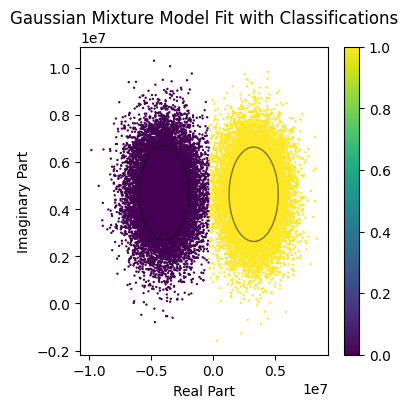

Qubit 49


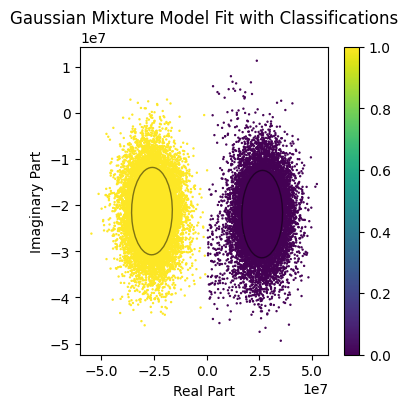

Qubit 50


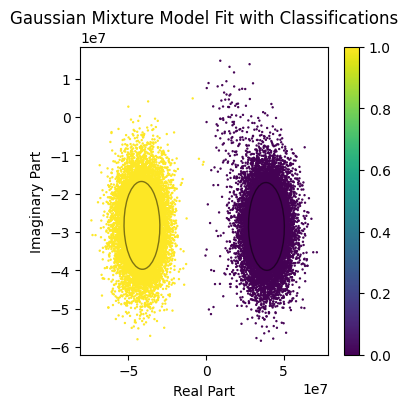

Qubit 51


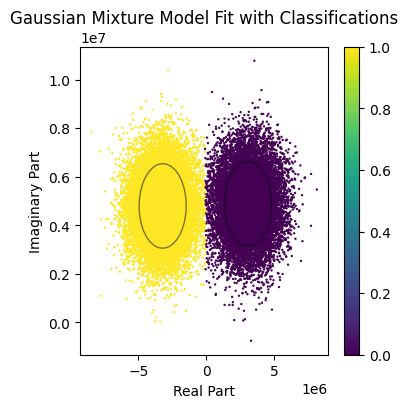

Qubit 52


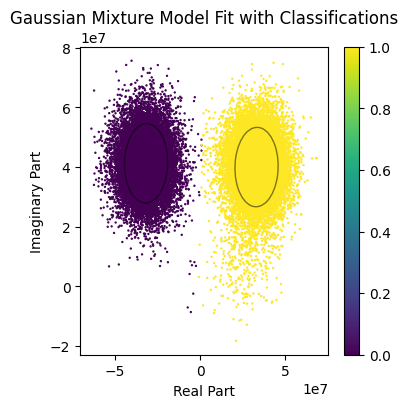

Qubit 53


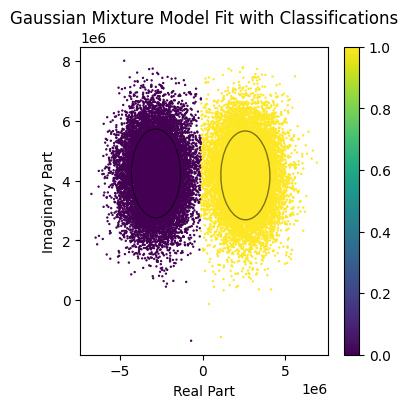

Qubit 54


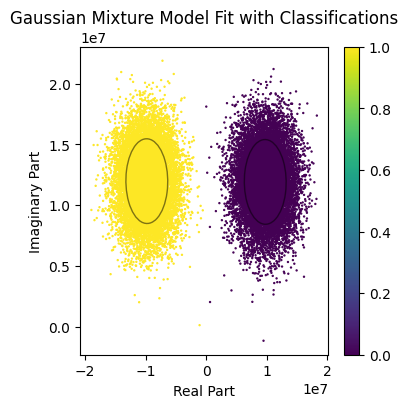

Qubit 55


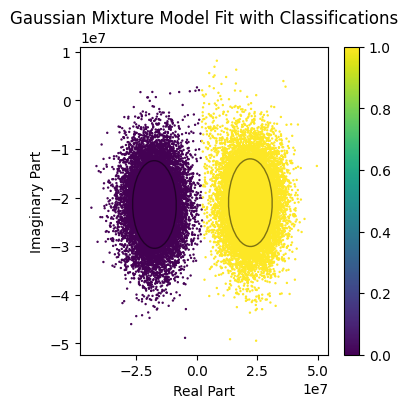

Qubit 56


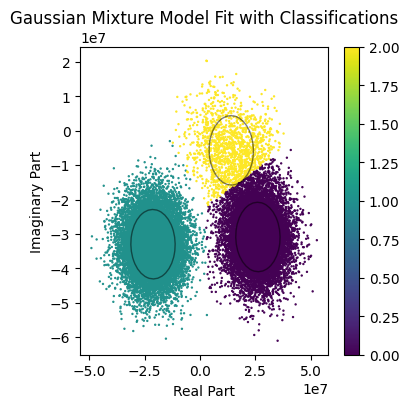

Qubit 57


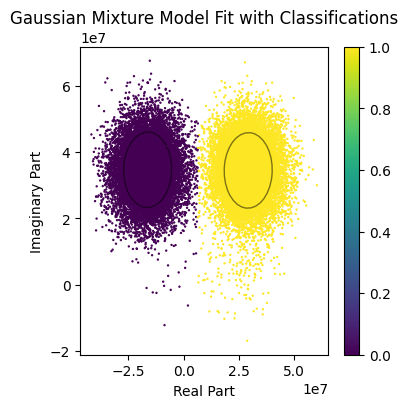

Qubit 58


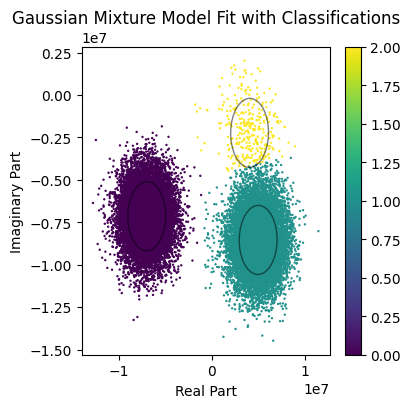

Qubit 59


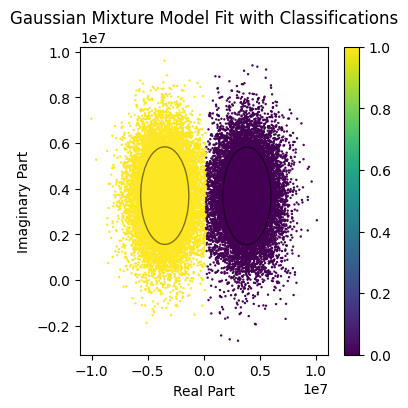

Qubit 60


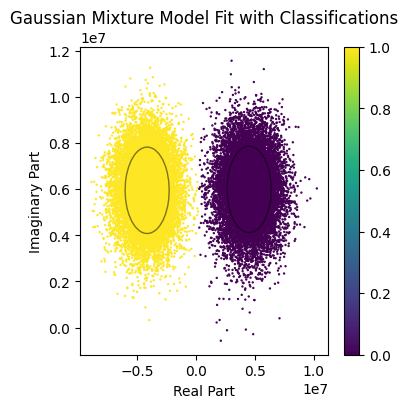

Qubit 61


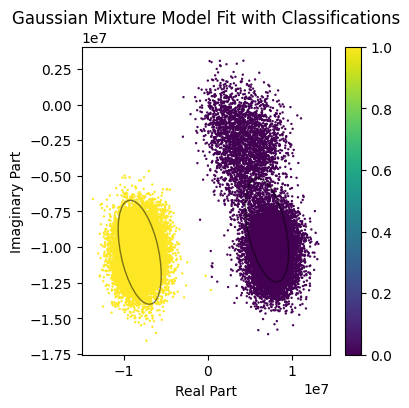

Qubit 62


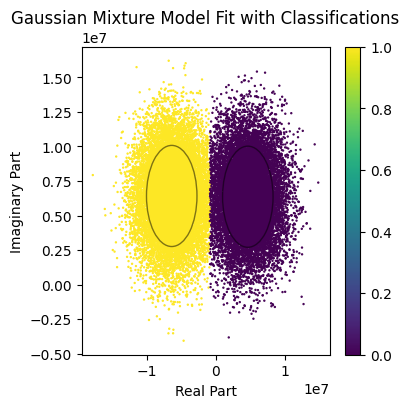

Qubit 63


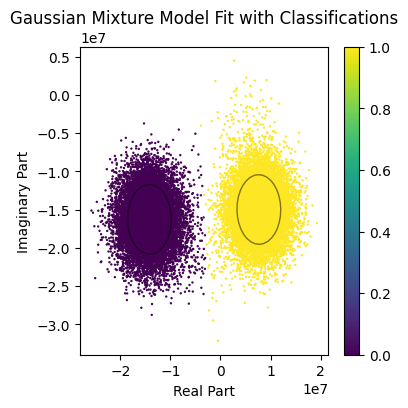

Qubit 64


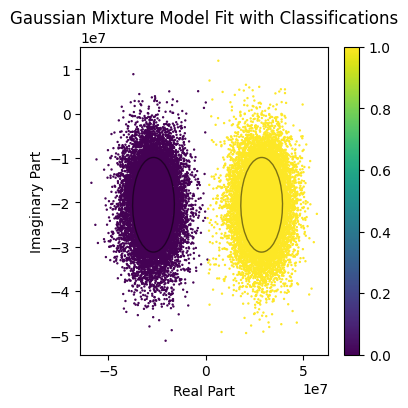

Qubit 65


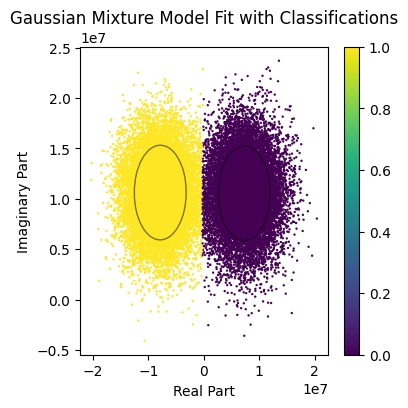

Qubit 66


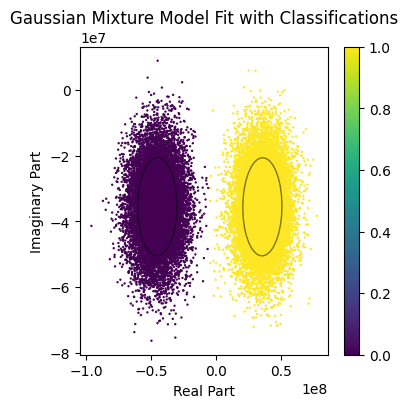

Qubit 67


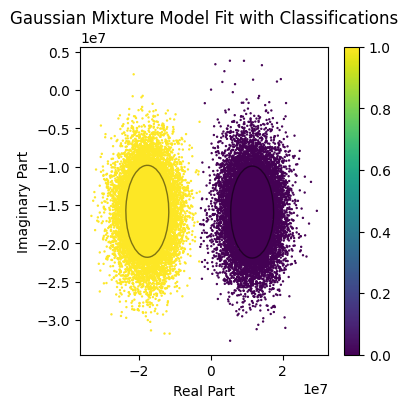

Qubit 68


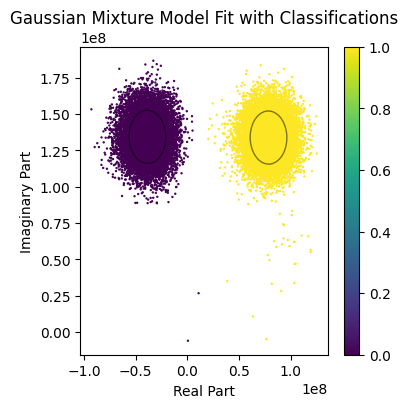

Qubit 69


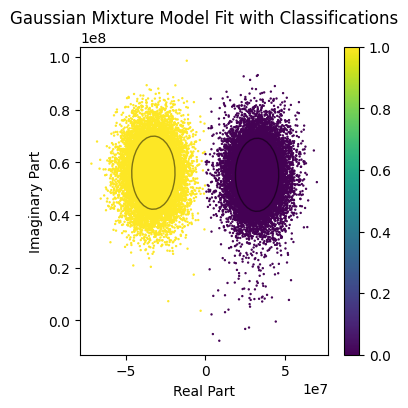

Qubit 70


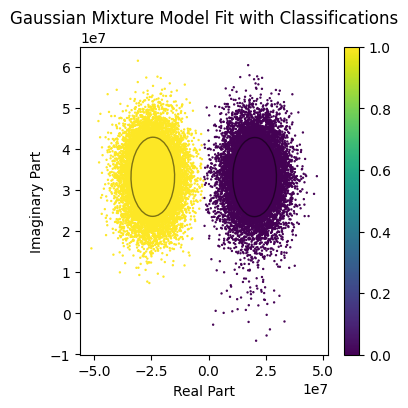

Qubit 71


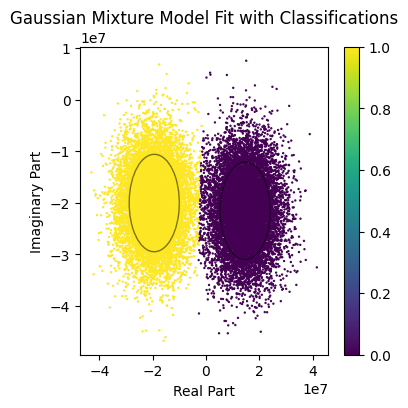

Qubit 72


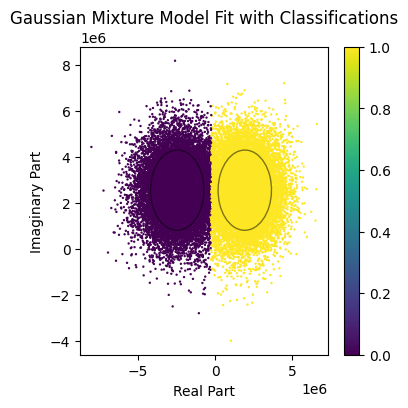

Qubit 73


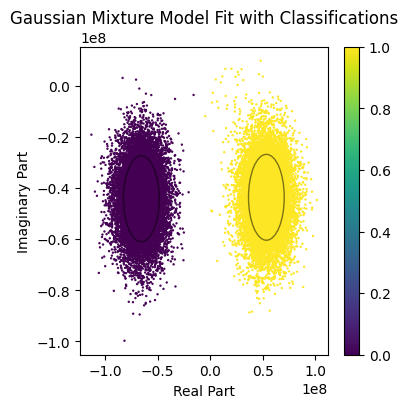

Qubit 74


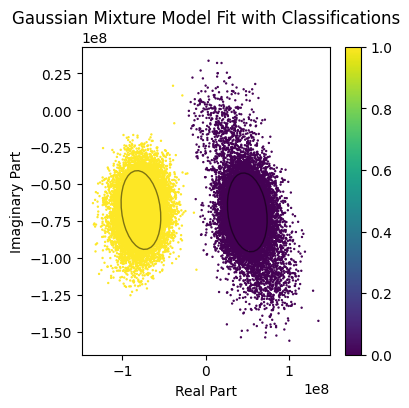

Qubit 75


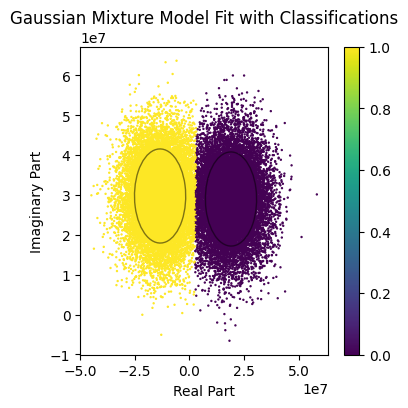

Qubit 76


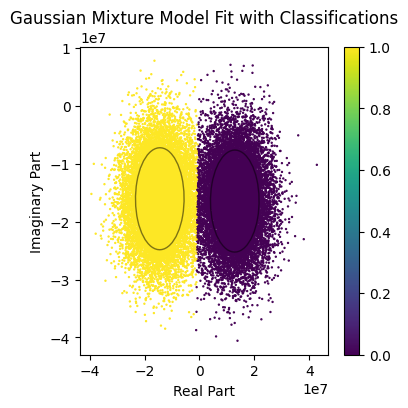

Qubit 77


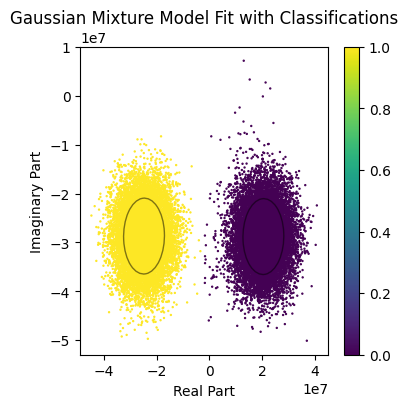

Qubit 78


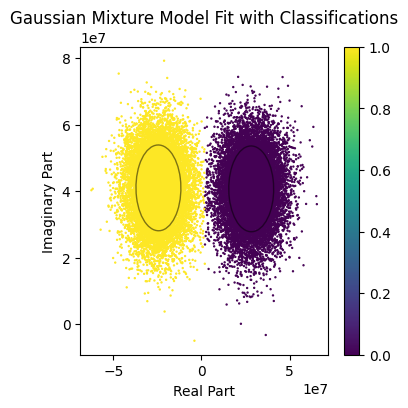

Qubit 79


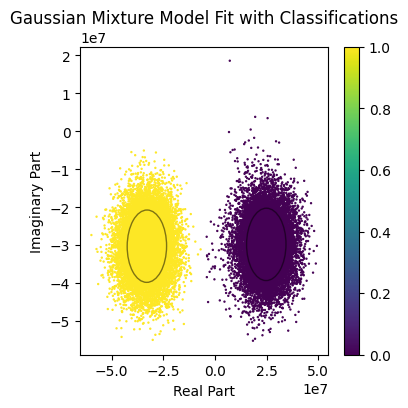

Qubit 80


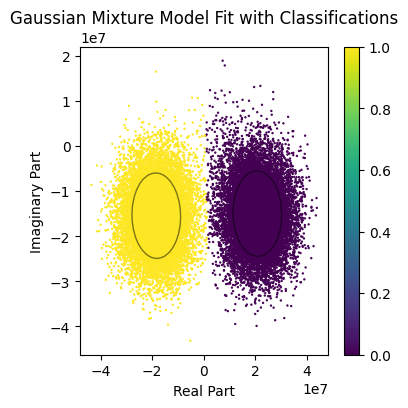

Qubit 81


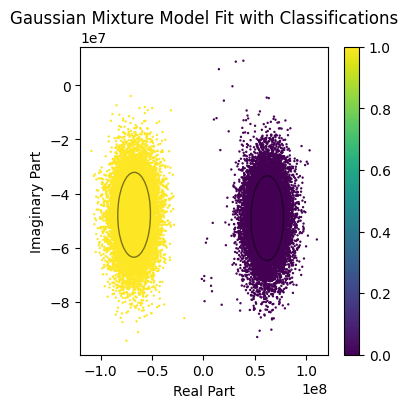

Qubit 82


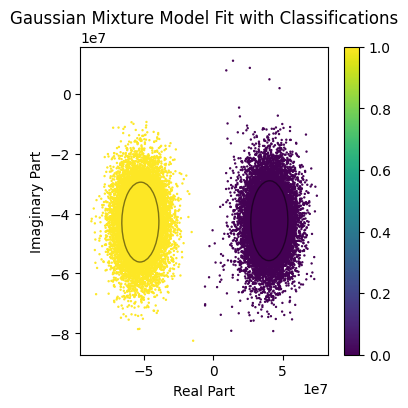

Qubit 83


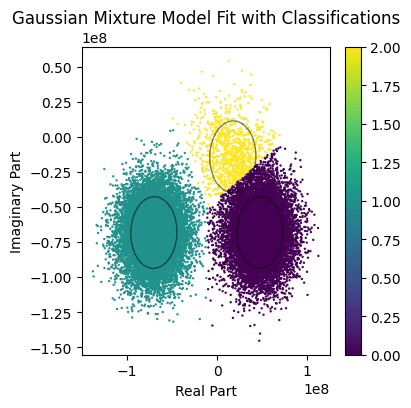

Qubit 84


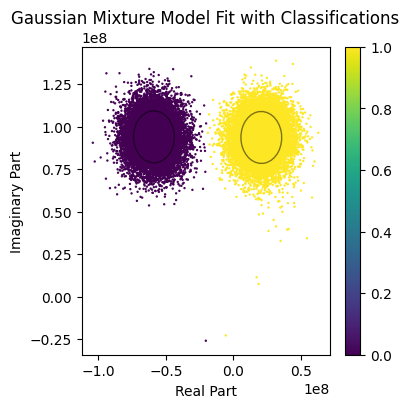

Qubit 85


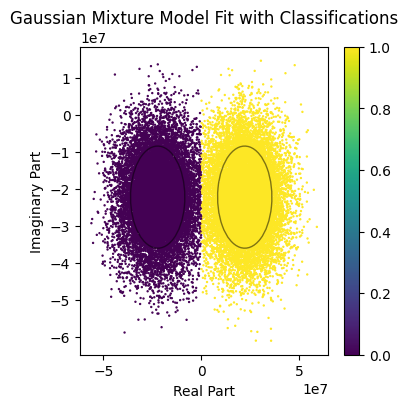

Qubit 86


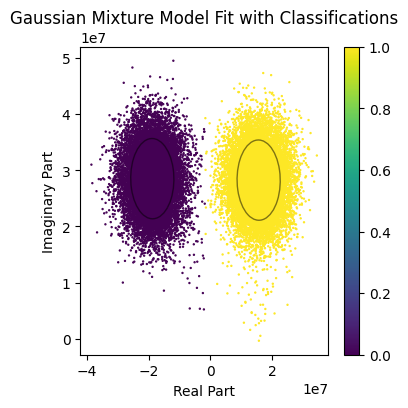

Qubit 87


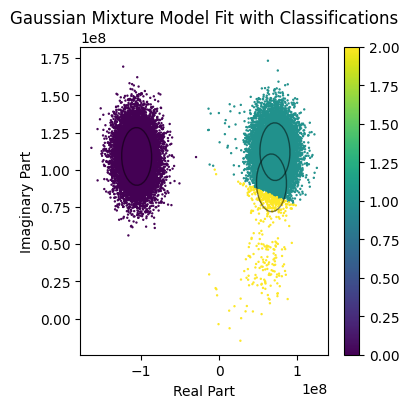

Qubit 88


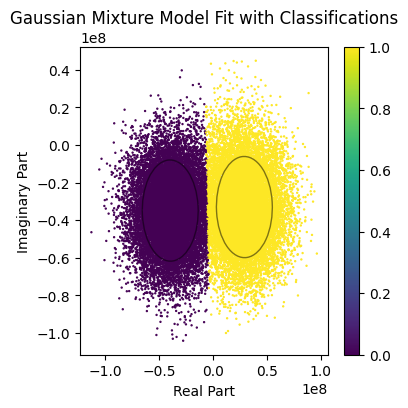

Qubit 89


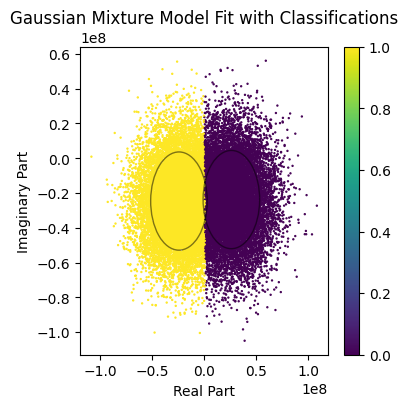

Qubit 90


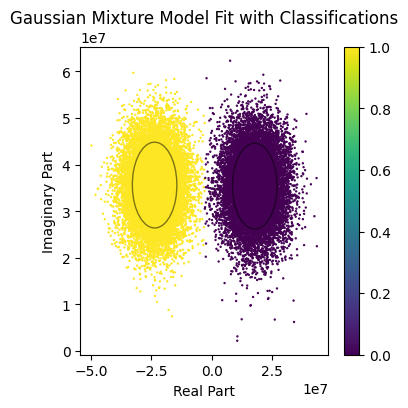

Qubit 91


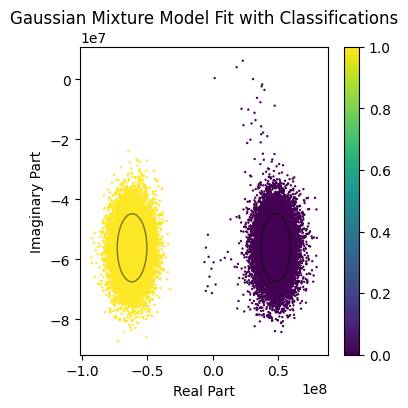

Qubit 92


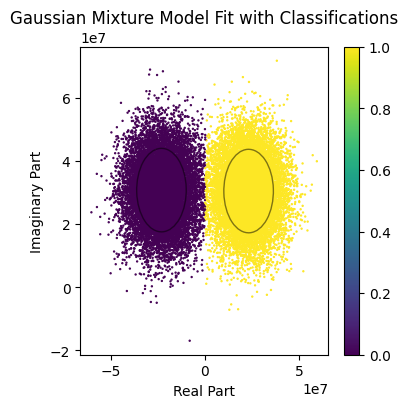

Qubit 93


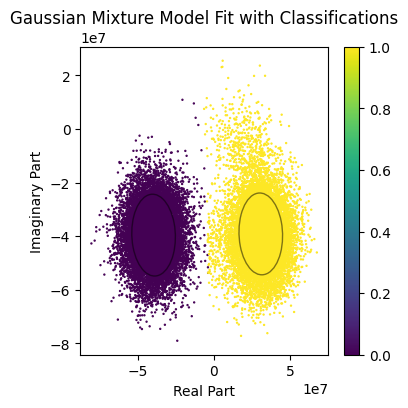

Qubit 94


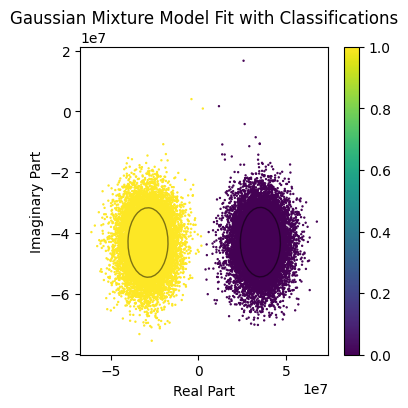

Qubit 95


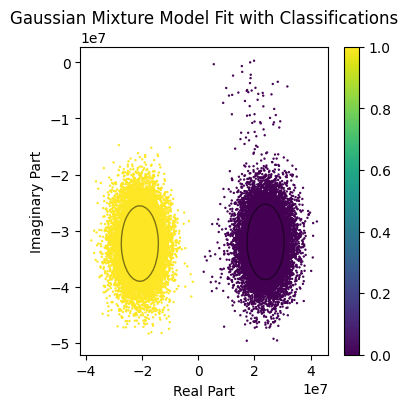

Qubit 96


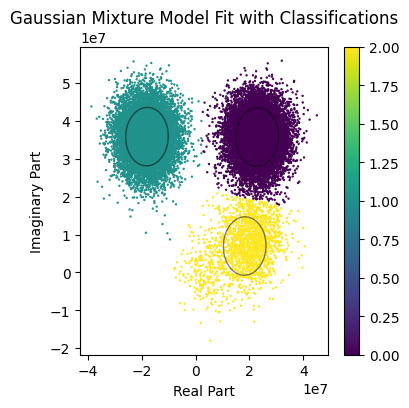

Qubit 97


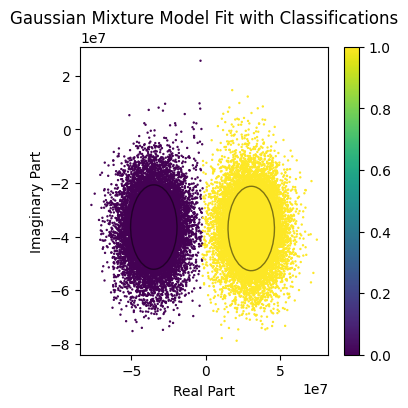

Qubit 98


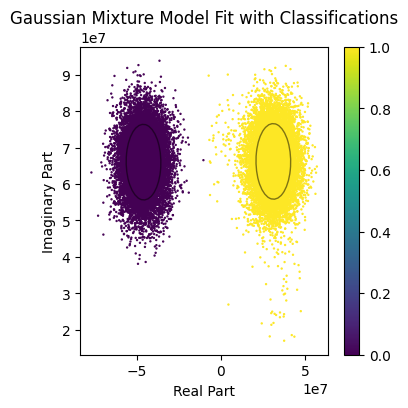

Qubit 99


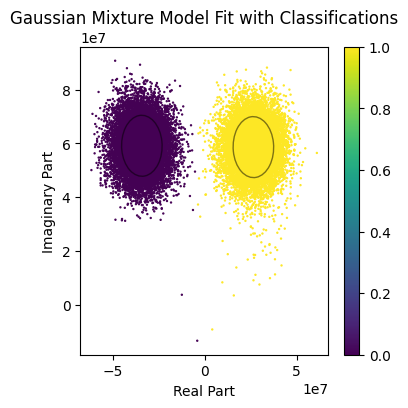

Qubit 100


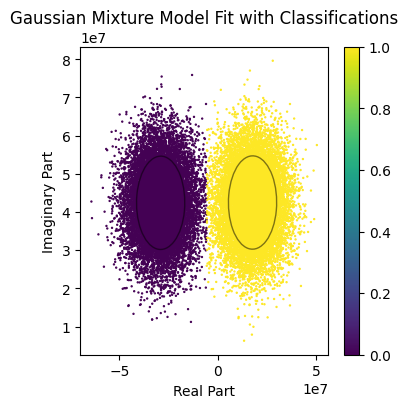

Qubit 101


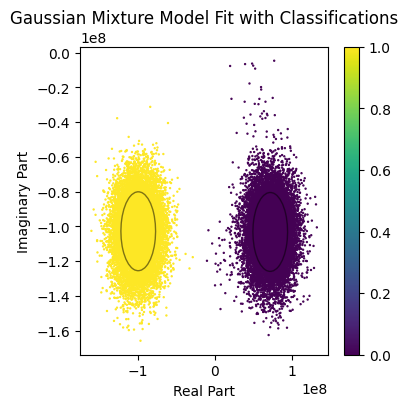

Qubit 102


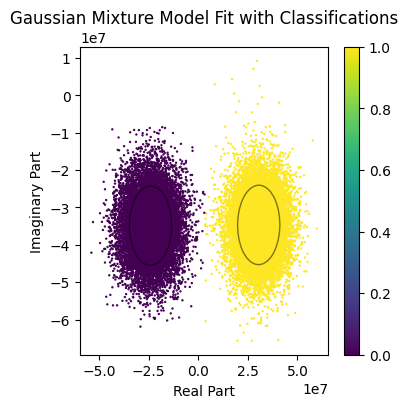

Qubit 103


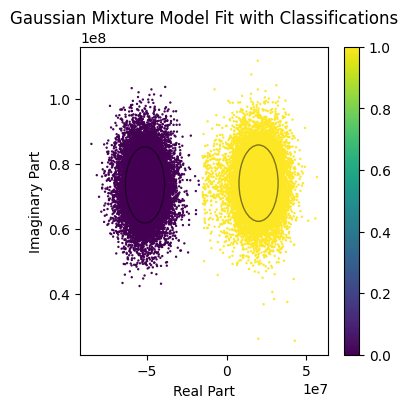

Qubit 104


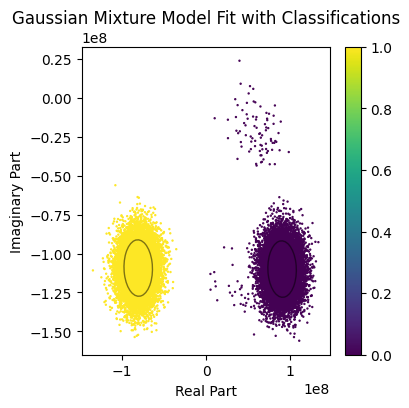

Qubit 105


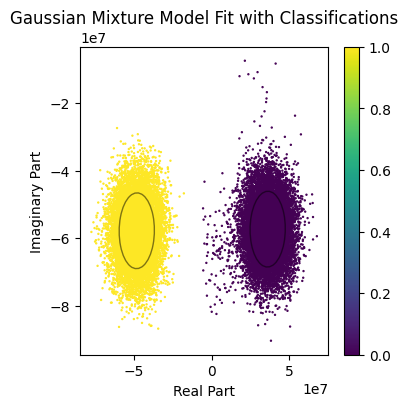

Qubit 106


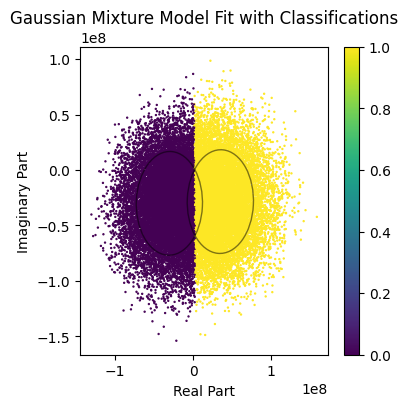

Qubit 107


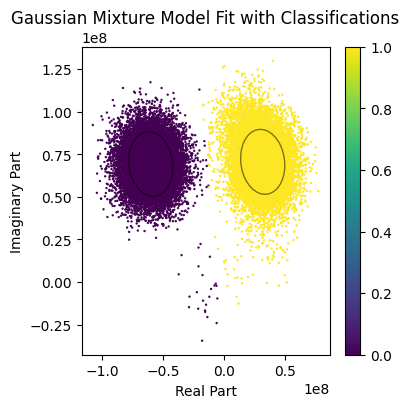

Qubit 108


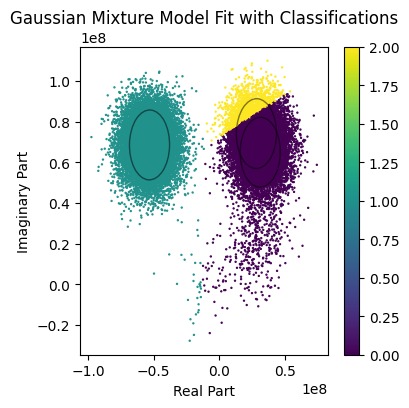

Qubit 109


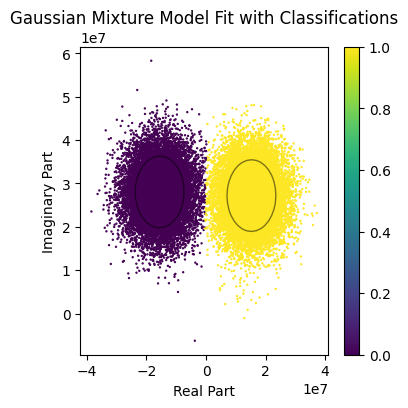

Qubit 110


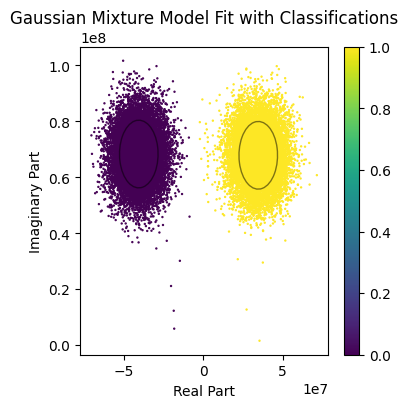

Qubit 111


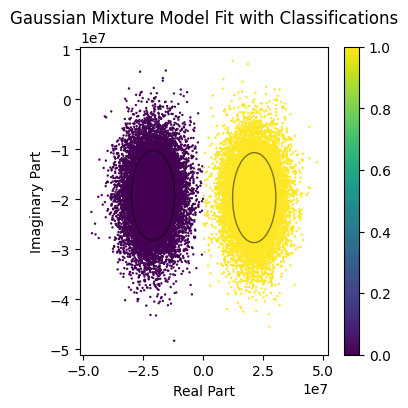

Qubit 112


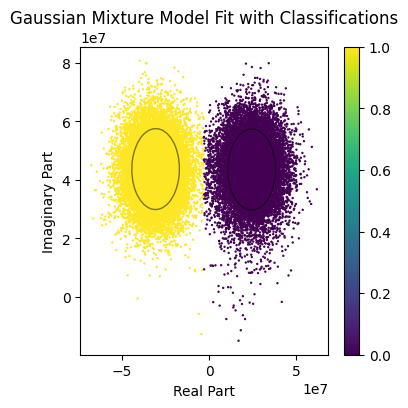

Qubit 113


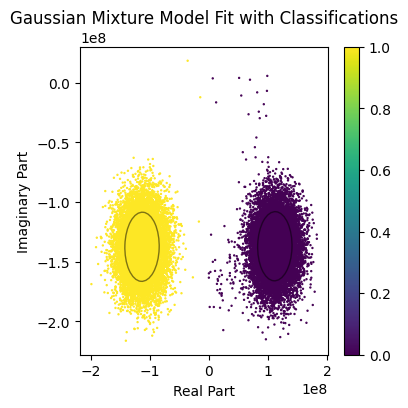

Qubit 114


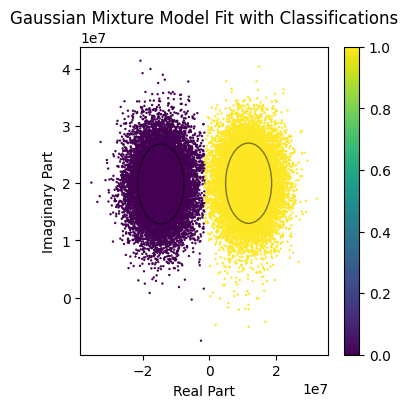

Qubit 115


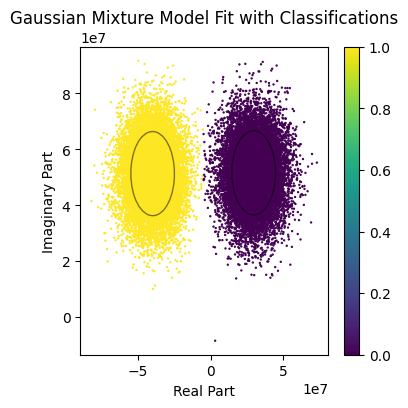

Qubit 116


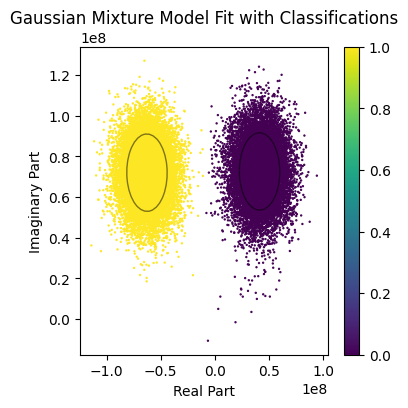

Qubit 117


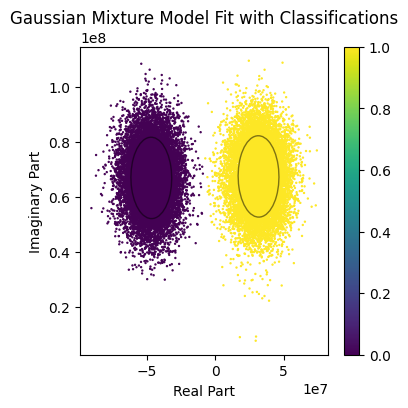

Qubit 118


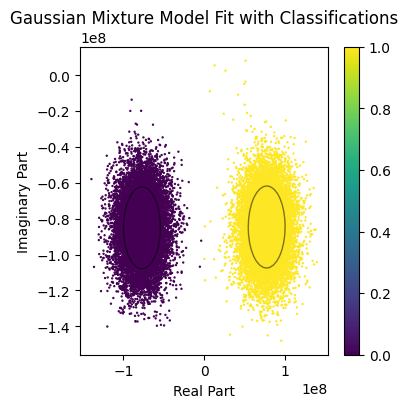

Qubit 119


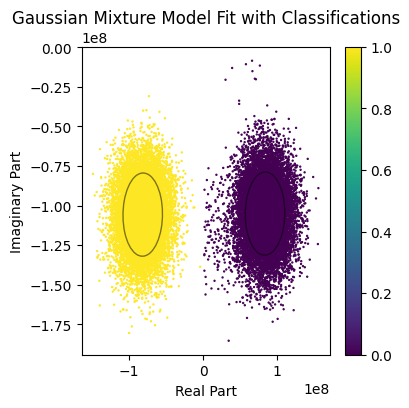

Qubit 120


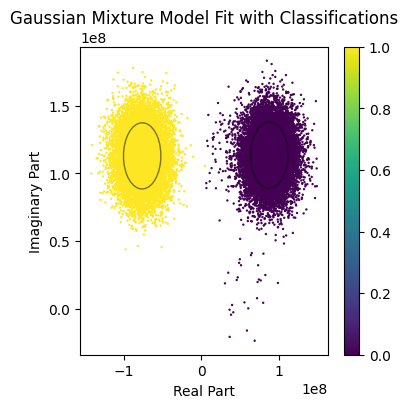

Qubit 121


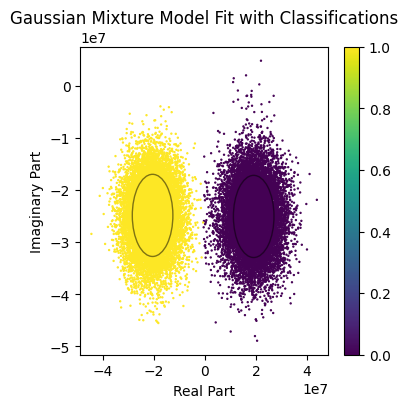

Qubit 122


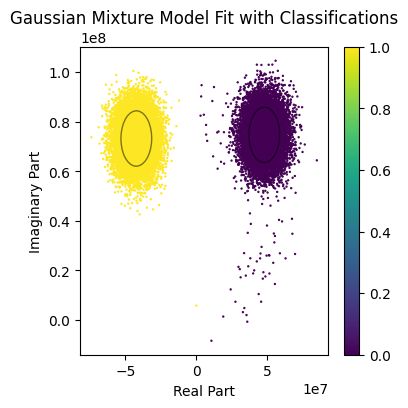

Qubit 123


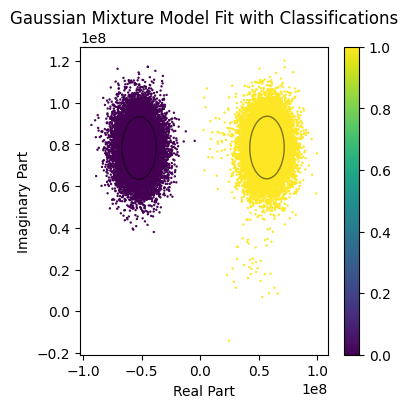

Qubit 124


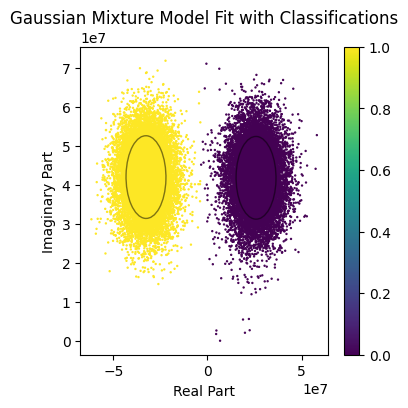

Qubit 125


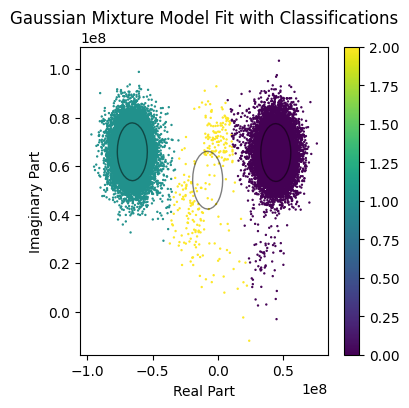

Qubit 126


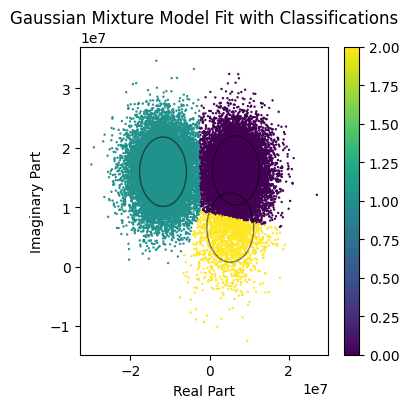

In [30]:
qubit = 3
for qubit in range(127):
    print(f"Qubit {qubit}")
    calib_data = np.hstack((all_memories_PS[qubit]['mmr_0'], all_memories_PS[qubit]['mmr_1']))
    fit_and_plot_gmm_with_classifications_informed(calib_data, n_components_range=[2, 3])